In [1]:
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import regularizers
import keras
import tensorflow as tf
import os

In [2]:
train_path = os.path.join(".", "rice_leaf", "train")
validation_path = os.path.join(".", "rice_leaf", "val")
test_path = os.path.join(".", "rice_leaf", "test")

In [17]:
class MyCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self,epoch,log = {}):
    if(log.get('val_accuracy')>0.90 and log.get('accuracy') > 0.90):
        print("\n Reached 90% Accuracy for training and validation.")
        self.model.stop_training = True

callbacks = MyCallback()

In [13]:
image_train_gen = ImageDataGenerator(rescale=1./255,
                                     zoom_range=0.2,
                                     rotation_range=360,
                                     horizontal_flip=True,
                                     fill_mode='nearest')

train_data_gen = image_train_gen.flow_from_directory(train_path,
                                                     shuffle=True,
                                                     batch_size=64,
                                                     target_size=(300,300),
                                                     class_mode='categorical')

img_val_gen = ImageDataGenerator(rescale=1./255)
val_data_gen = img_val_gen.flow_from_directory(validation_path,
                                               batch_size=32,
                                               target_size=(300,300),
                                               class_mode='categorical')

Found 650 images belonging to 3 classes.
Found 248 images belonging to 3 classes.


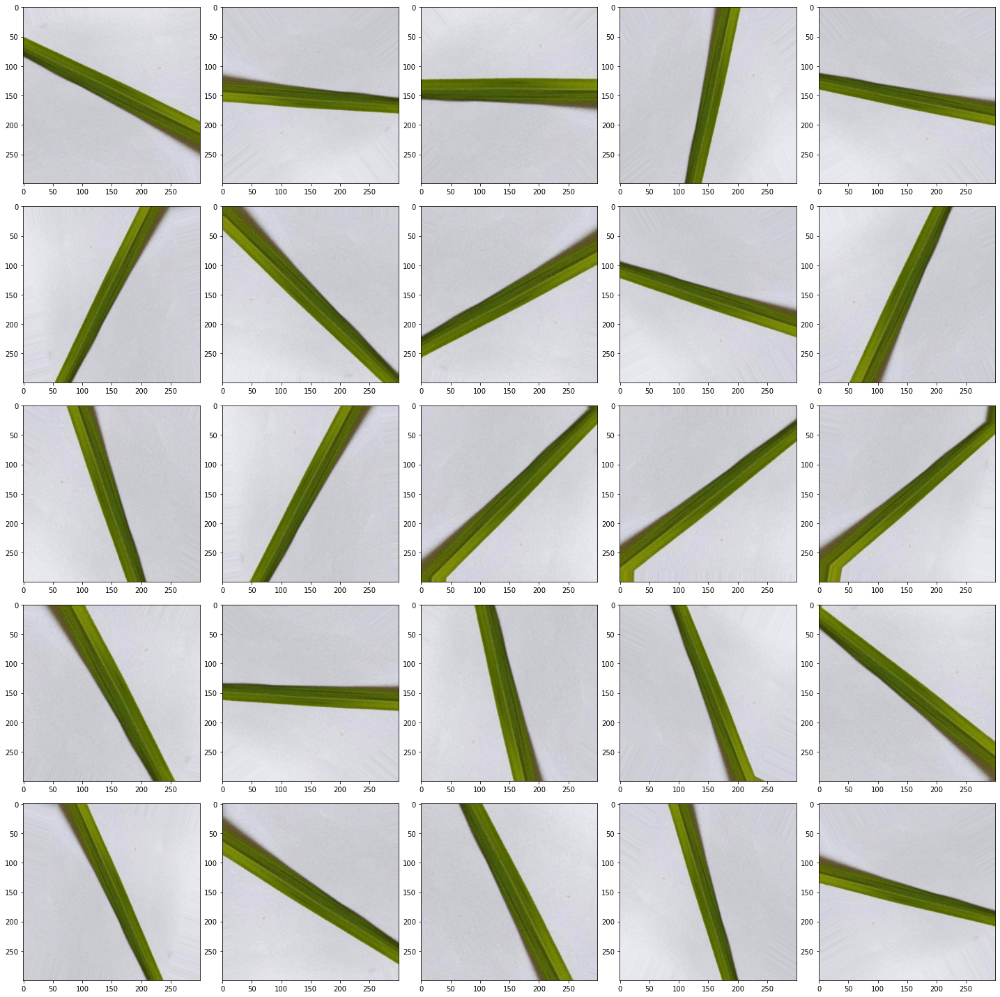

In [14]:
import matplotlib.pyplot as plt
def plotImages(image_arr):
    fig,axes = plt.subplots(5, 5, figsize=(20,20))
    axes = axes.flatten()
    for img,ax in zip(image_arr,axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()
    
img_array = [train_data_gen[0][0][0] for i in range(25)]
plotImages(img_array)

In [21]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300, 300, 3)),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

# Print the model summary
model.summary()
model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss = "categorical_crossentropy",
    metrics = ['accuracy']
)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 149, 149, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 73, 73, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 35, 35, 64)      

In [22]:
history = model.fit(train_data_gen, 
                    epochs=300, 
                    validation_data = val_data_gen, 
                    verbose = 1,
                    callbacks = [callbacks]
                   )

Epoch 1/300
11/11 [==============================] - 21s 2s/step - loss: 1.0557 - accuracy: 0.4138 - val_loss: 1.0512 - val_accuracy: 0.4113
Epoch 2/300
11/11 [==============================] - 20s 2s/step - loss: 1.0416 - accuracy: 0.4354 - val_loss: 1.0463 - val_accuracy: 0.4798
Epoch 3/300
11/11 [==============================] - 20s 2s/step - loss: 1.0339 - accuracy: 0.4692 - val_loss: 1.0314 - val_accuracy: 0.4194
Epoch 4/300
11/11 [==============================] - 20s 2s/step - loss: 1.0308 - accuracy: 0.4292 - val_loss: 1.0332 - val_accuracy: 0.3952
Epoch 5/300
11/11 [==============================] - 20s 2s/step - loss: 1.0213 - accuracy: 0.4185 - val_loss: 1.0171 - val_accuracy: 0.4032
Epoch 6/300
11/11 [==============================] - 20s 2s/step - loss: 0.9914 - accuracy: 0.4815 - val_loss: 0.9633 - val_accuracy: 0.5403
Epoch 7/300
11/11 [==============================] - 20s 2s/step - loss: 0.9590 - accuracy: 0.5123 - val_loss: 0.9563 - val_accuracy: 0.4960
Epoch 8/300
1

Epoch 59/300
11/11 [==============================] - 21s 2s/step - loss: 0.3168 - accuracy: 0.8769 - val_loss: 0.4744 - val_accuracy: 0.8226
Epoch 60/300
11/11 [==============================] - 20s 2s/step - loss: 0.3077 - accuracy: 0.8677 - val_loss: 0.3806 - val_accuracy: 0.8589
Epoch 61/300
11/11 [==============================] - 21s 2s/step - loss: 0.2935 - accuracy: 0.8585 - val_loss: 0.4921 - val_accuracy: 0.8185
Epoch 62/300
11/11 [==============================] - 20s 2s/step - loss: 0.3066 - accuracy: 0.8846 - val_loss: 0.4800 - val_accuracy: 0.8306
Epoch 63/300
11/11 [==============================] - 21s 2s/step - loss: 0.2947 - accuracy: 0.8815 - val_loss: 0.4484 - val_accuracy: 0.8427
Epoch 64/300
11/11 [==============================] - 20s 2s/step - loss: 0.2998 - accuracy: 0.8708 - val_loss: 0.5106 - val_accuracy: 0.8145
Epoch 65/300
11/11 [==============================] - 20s 2s/step - loss: 0.2986 - accuracy: 0.8692 - val_loss: 0.4668 - val_accuracy: 0.8226
Epoch 

In [23]:
import numpy as np

acc = np.array([])
val_acc = np.array([])

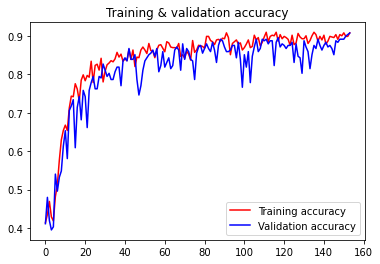

<Figure size 432x288 with 0 Axes>

In [24]:
import matplotlib.pyplot as plt

# Plot the results
acc = np.concatenate((acc,history.history['accuracy']), axis=0)
val_acc = np.concatenate((val_acc,history.history['val_accuracy']), axis=0)

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training & validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

1/1 [==============================] - 0s 24ms/step
Accuracy : 0.86


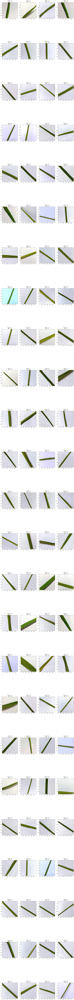

In [25]:
import numpy as np
from tensorflow.keras.preprocessing import image

def consecutive_means(input_tensor):
  num_outputs = len(input_tensor) - 1
  x = np.zeros(num_outputs)
  for i in range(num_outputs):
      x[i] = 1/2 * (input_tensor[i] + input_tensor[i+1]) 
  return x

def between(x):
    if x == 0:
        return "2-3"
    elif x == 1:
        return "3-4"
    elif x == 2:
        return "4-5"
    
dirs = []
for i in os.listdir(test_path):
    path = os.path.join(".","rice_leaf", "test", i)
    files = os.listdir(path)
    for file in files:
        dirs.append(os.path.join(".","rice_leaf", "test", i, file))
n = len(dirs)
np.random.shuffle(dirs)
counter = 0
plt.subplots(figsize=(20,n*3))
for i,fn in enumerate(dirs):
    # predicting images
    path = os.path.join(fn)
    real_class = path.split("\\")[-2]
    img = image.load_img(path, target_size=(300, 300))
    x = image.img_to_array(img) / 255
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    classes = model.predict(images, batch_size=10)
    if between(np.argmax(classes)) == real_class:
        counter += 1
    plt.subplot(n//4 + 1,4,i+1)
    plt.imshow(img)
    plt.title("Predict : " + str(between(np.argmax(classes))) + "\nReal : " + real_class)
    
print("Accuracy : " + str(counter/n))

In [26]:
import pathlib
import tensorflow as tf
export_dir = './saved_model/model'
tf.saved_model.save(model, export_dir)

mode = "Speed" 

if mode == 'Storage':
    optimization = tf.lite.Optimize.OPTIMIZE_FOR_SIZE
elif mode == 'Speed':
    optimization = tf.lite.Optimize.OPTIMIZE_FOR_LATENCY
else:
    optimization = tf.lite.Optimize.DEFAULT
    
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)

converter.optimizations = [optimization]

tflite_model = converter.convert()

tflite_model_file = pathlib.Path('./color_classification.tflite')
tflite_model_file.write_bytes(tflite_model)

INFO:tensorflow:Assets written to: ./saved_model/fixed1\assets


INFO:tensorflow:Assets written to: ./saved_model/fixed1\assets


2168432